<a href="https://colab.research.google.com/github/shivammehta007/About-Me/blob/master/src/notebooks/HMM_for_ContinousData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
#The notebook broke when Colab upgraded its version of PyTorch. Not sure why that is, but using this version instead fixes it:
!pip install torch==1.5.0

In [21]:
import os
logs_base_dir = "runs"
os.makedirs(logs_base_dir, exist_ok=True)

# Continuous Density Hidden Markov Models

In [22]:
import math
import torch
import torch.utils.data


import pdb
import numpy as np
import seaborn as sns
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.distributions as tdist

from sklearn.model_selection import train_test_split
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter


%matplotlib inline
%load_ext tensorboard

writer = SummaryWriter()
torch.set_default_dtype(torch.float64)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Generate Observations

In [23]:
def generate_observations(n=25):

    sigma_y = 0.05

    mean_dur = 40
    end_angle = 2*math.pi

    mu_delta_angle = end_angle/mean_dur
    sigma_delta_angle = mu_delta_angle/2
    
    data = []
    for i in range(n):
        y_vals = []

        angle = 0
        while angle < end_angle:
            mu_y = (1 - math.cos(angle))/2
            y_vals.append(mu_y + sigma_y*np.random.randn())
            
            angle += mu_delta_angle + sigma_delta_angle*np.random.randn()
        
        data.append(y_vals)
    
    return data

In [24]:
data = generate_observations(100)
len(data)

100

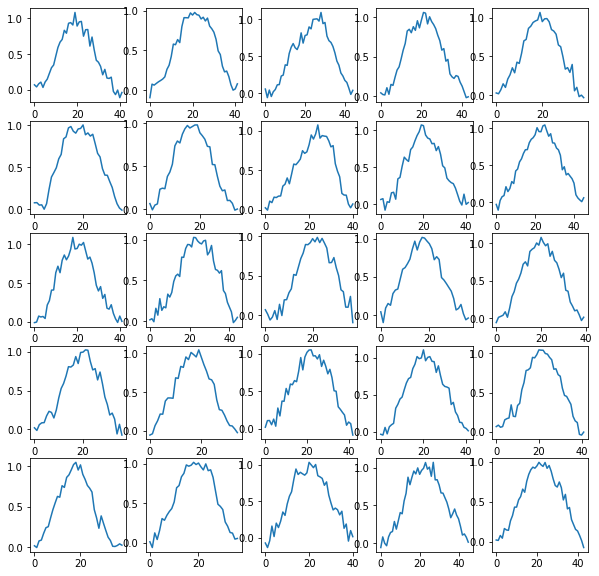

In [25]:
columns = 5
rows = 5
fig, ax_array = plt.subplots(rows, columns,squeeze=False, figsize=(10,10))
for i,ax_row in enumerate(ax_array):
    for j,axes in enumerate(ax_row):
        axes.plot(data[i*5 + j])
plt.show()

## Define HMM

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Transition Model

In [27]:
class TransitionModel(nn.Module):
    def __init__(self, N):
        super(TransitionModel, self).__init__()
        self.N = N

        # Creates a left-to-right HMM Matrix
        transition_matrix = torch.tril(torch.triu(torch.randn(N, N), diagonal=-1), diagonal=0)

        self.unnormalized_transition_matrix = nn.Parameter(transition_matrix)

    def forward(self, log_alpha):
        """
        It is the product of the past state with transitional probabilities
        and since it is in log scale, the product will be converted to logsumexp
        log_alpha : Tensor of shape (batch size, N)
        Multiply previous timestep's alphas by transition matrix (in log domain)
        """

        # The transition from one state to another
        # log_transition_matrix = F.log_softmax(self.unnormalized_transition_matrix, dim=0)

        

        # The conditional probability product as explained in the algorithm
        out = self.log_domain_matmul(log_transition_matrix, log_alpha.permute(1, 0)).permute(1, 0)

        return out


    def log_domain_matmul(self, log_a, log_b):
        """
        log_a : m x n
        lob_b : n x p
        out : m x p
        Computes output_{i, j} = logsumexp_k [ log_A_{i, k} + log_B{k, j} ]
        """

        m, n, p = log_a.shape[0], log_a.shape[1], log_b.shape[1]

        # Dimensions must be same to add

        # Expand A to the p size
        log_A_expanded = torch.stack([log_a] * p, dim=2) 
        # Expand B to m size 
        log_B_expanded = torch.stack([log_b] * m, dim=0)
        # These expansion will result in addition

        elementwise_sum = log_A_expanded + log_B_expanded


        out = torch.logsumexp(elementwise_sum, dim=1)

        return out


### Emission Model

In [28]:
class EmissionModel(nn.Module):
    def __init__(self, N):
        super(EmissionModel, self).__init__()

        means = torch.zeros([N])
        std = torch.ones([N])

        self.means = nn.Parameter(means)
        self.std = nn.Parameter(std)

        self.emission_dists = tdist.normal.Normal(self.means, self.std)


    def sample(self):
        return self.emission_dists.sample()

    def forward(self, x_t):
        """
        Emission probabilities of the current hidden state to observed state
        """
        
        # Add a dimension to generate log_prob

        x_t = x_t.view(-1, 1)

        out = self.emission_dists.log_prob(x_t)

        return out



    ########################################################################
    ####################### Code for one Distribution for each state #######
    ########################################################################
    # Problem I think is that for forward implementation we will have to multiply
    # Iteratively, which will not longer be vectorized implementation and thus
    # will take more time

    #     Maybe later we will one distribution for each hidden state represented
    #     by different objects problem with this is the matrix multiplication then
    #     self.emission_dists = [tdist.normal.Normal(self.means[i], self.std[i]) for i in range(N)]

    # def sample(self, state):
    #     """
    #     Samples from a normal distribution of mean and standard deviation of state
    #     """
    #     return self.emission_dists[state].sample()

### HMM Model

In [64]:
class HMM(nn.Module):
    def __init__(self, N):

        super(HMM, self).__init__()
        
        # Number of hidden states
        self.N = N

        # A_{ij}
        self.transition_model = TransitionModel(N)

        # b_{s}(x_t) 
        self.emission_model = EmissionModel(N)

        # Left to Right State Priors:
        

        # self.unnormalized_state_priors = torch.nn.Parameter(torch.randn(self.N))

        ## State priors are not trained
        self.unnormalized_state_priors = torch.zeros(self.N)
        self.unnormalized_state_priors[0] = 1.0

        # Put the model to GPU if available
        self.to(device)

    def sample(self, T = 40):     
        
        self.state_prior = self.unnormalized_state_priors

        self.transition_matrix = F.softmax(self.transition_model.unnormalized_transition_matrix, dim=0)

        pdb.set_trace()

        # Sample Initial state
        z_t = self.state_prior.multinomial(1)[0].item()
        z, x= [], []
        z.append(z_t)

        for t in range(0, T): # Start sampling for T times
            # Sample Emission 
            x_t = self.emission_model.sample()[z_t].item()
            x.append(x_t)

            # Create a categorical distribution everytime 
            z_t = self.transition_matrix[:,z_t].multinomial(1)[0].item()


            ## TODO: End state will come somewhere here (as per my current understanding)

            if t < T-1: z.append(z_t)
        


        plt.plot(x)
        plt.show()

        return x, z


    def forward(self, x, T):
        """
        x = Data Input
        T = Length of each example
        """

        x = x.to(device)
        T = T.to(device)

        batch_size = x.shape[0]

        # Size of input in this batch
        T_max = x.shape[1]

        # Pi
        state_priors = self.unnormalized_state_priors

        # Create a placeholder for all alpha_s,t 
        log_alpha = torch.zeros([batch_size, T_max, self.N], device=device)

        # For first there is no alpha_s,t-1 so we multiply with the state priors
        log_alpha[:, 0, :] = self.emission_model(x[:, 0]) + state_priors 


        # for others we use the emission probability * (product of transition probability and previous state at t-1 i.e s`-1, t-1)
        for t in range(1, T_max):
            log_alpha[:, t, :] = self.emission_model(x[:, t]) + self.transition_model(log_alpha[:, t - 1, :])


            # if t == 1:
            #     print("Emission Model Output: ",self.emission_model(x[:, t]).shape)
            #     print("Transition Model Output:", self.transition_model(log_alpha[:, t - 1, :]).shape)

        log_sums = torch.logsumexp(log_alpha, dim=2)

        # This will only give me the last element i.e my final p(x) of the final state 

        log_probs = torch.gather(log_sums, 1, T.view(-1, 1) - 1)


        return log_probs




#### Generating Test Sample

In [65]:
hmm = HMM(5)

In [66]:
z, x = hmm.sample(40)
print("Observations: ", z)
print("Hidden States: ", x)

> <ipython-input-64-478e79932592>(36)sample()
-> z_t = self.state_prior.multinomial(1)[0].item()
(Pdb) self.transition_matrix
tensor([[0.4243, 0.1077, 0.1909, 0.0272, 0.0738],
        [0.0767, 0.1021, 0.1668, 0.3848, 0.0665],
        [0.0551, 0.3379, 0.1013, 0.1123, 0.6209],
        [0.0232, 0.1719, 0.4333, 0.0187, 0.1123],
        [0.4207, 0.2804, 0.1078, 0.4571, 0.1265]], grad_fn=<SoftmaxBackward>)
(Pdb) self.transition_matrix[:,z_t]
*** NameError: name 'z_t' is not defined
(Pdb) self.transition_matrix[:,0]
tensor([0.4243, 0.0767, 0.0551, 0.0232, 0.4207], grad_fn=<SelectBackward>)
--KeyboardInterrupt--
(Pdb) quit


BdbQuit: ignored

## Creating DataLoader

In [44]:
class Collate:
    def __init__(self):
        pass
    
    def __call__(self, batch):
        """
        Returns minibatch of strings, and pad it to have same length
        """

        batch_size = len(batch)
        x_lengths = [len(t) for t in batch]
        T = max(x_lengths)

        for index in range(batch_size):
            batch[index] = batch[index] + [0] * (T - len(batch[index]))
            batch[index] = torch.tensor(batch[index])

        x = torch.stack(batch)
        x_lengths = torch.tensor(x_lengths)
        return x, x_lengths


class ContinuousDataset(torch.utils.data.Dataset):
    def __init__(self, continous_input, batch_size=10):
        self.data = continous_input
        collate = Collate()
        self.loader = torch.utils.data.DataLoader(self, batch_size=batch_size, num_workers=1, shuffle=True, collate_fn=collate)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        return self.data[index]


### Creating Training Dataset

In [45]:
train_dataset = ContinuousDataset(data)

## Training

### Trainer Utility

In [46]:
class Trainer:
    def __init__(self, model, lr):
        self.model = model
        self.lr = lr
        self.optimizer = torch.optim.Adam(model.parameters(), lr=self.lr, weight_decay=0.00001)

    def train(self, dataset):
        """
        Training Loop
        """
        train_loss = 0
        num_samples = 0
        self.model.train()
        print_interval = 24

        for i, batch in enumerate(tqdm(dataset.loader)):
            x, T = batch
            self.optimizer.zero_grad()
            batch_size = len(x)
            num_samples += batch_size
            log_probs = self.model(x, T)
            loss = -log_probs.mean()

            if torch.isnan(loss):
                pdb.set_trace()

            loss.backward()
            self.optimizer.step()
            train_loss += loss.cpu().data.numpy().item() * batch_size

            # writer.add_scalar("Means", model.emission_model.means)
            # writer.add_scalar("Std", model.emission_model.std)
            # writer.add_scalar("State Prior", model.state_prior)
            # writer.add_scalar("Transition Probability", model.transition_model.unnormalized_transition_matrix)

            if i % print_interval == 0:
                # print("Losss: ", loss.item())
                # for _ in range(5):
                sampled_x, sampled_z = self.model.sample()
        
        train_loss /= num_samples
        return train_loss


    def test(self, dataset):
        test_loss = 0
        num_samples = 0 
        self.model.eval()
        print_interval = 50

        for i, batch in enumerate(dataset.loader):
            x, T = batch
            batch_size = len(x)
            num_samples += batch_size
            loss_probs = self.model(x, T)
            loss = -loss_probs.mean()

            test_loss += loss.cpu().data.numpy().item() * batch_size
            if i % print_interval == 0:
                # print("Loss: ", loss.item())
                sampled_x, sampled_z = self.model.sample()

        test_loss /= num_samples
        return test_loss


### Training Epochs

In [47]:
model = HMM(N=10)

#### Writing Model Graph to Tensorboard

In [48]:
# Write model graph to Tensorboard
input = torch.stack([torch.tensor(next(iter(train_dataset))[:5])]) 
writer.add_graph(model, (input, torch.tensor([5])))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:84: TracerWarning: Converting a tensor to a Python index might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: TracerWarning: Converting a tensor to a Python index might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:42: TracerWarning: Converting a tensor to a Python index might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!


#### Training Model

  0%|          | 0/10 [00:00<?, ?it/s]

========= Epoch 1 of 100 =========


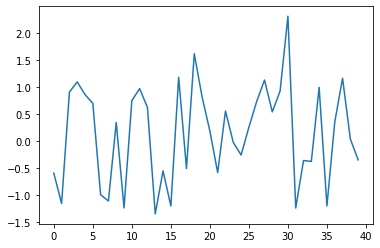

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 1 of 100 =========
train loss: 40.44

========= Epoch 2 of 100 =========


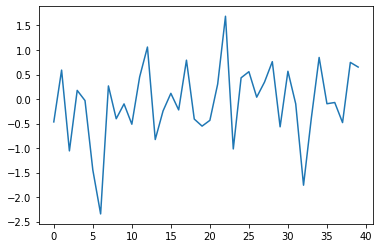

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 2 of 100 =========
train loss: 35.54

========= Epoch 3 of 100 =========


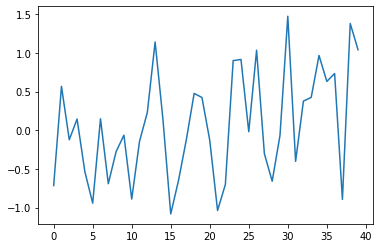

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 3 of 100 =========
train loss: 30.16

========= Epoch 4 of 100 =========


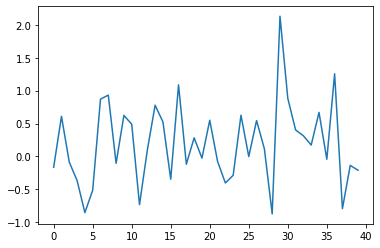

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 4 of 100 =========
train loss: 24.38

========= Epoch 5 of 100 =========


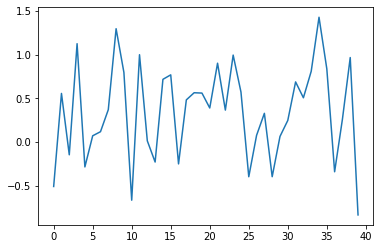

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 5 of 100 =========
train loss: 18.57

========= Epoch 6 of 100 =========


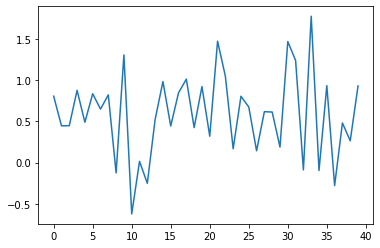

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 6 of 100 =========
train loss: 14.44

========= Epoch 7 of 100 =========


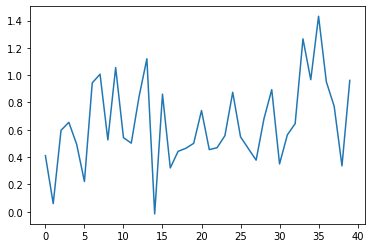

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 7 of 100 =========
train loss: 13.70

========= Epoch 8 of 100 =========


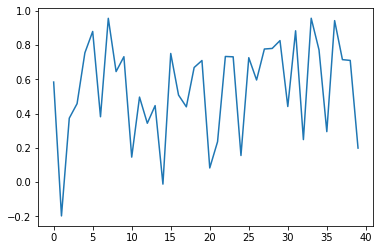

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 8 of 100 =========
train loss: 12.16

========= Epoch 9 of 100 =========


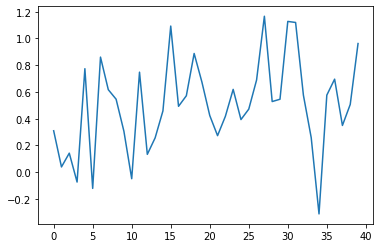

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 9 of 100 =========
train loss: 4.81

========= Epoch 10 of 100 =========


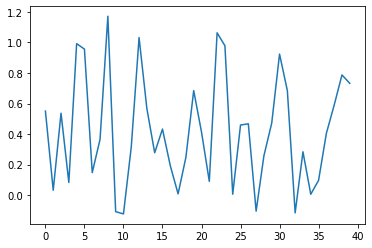

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 10 of 100 =========
train loss: -6.49

========= Epoch 11 of 100 =========


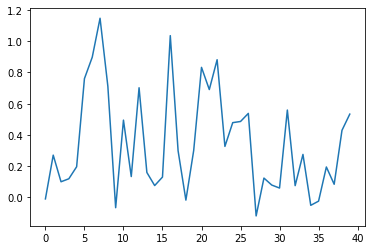

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 11 of 100 =========
train loss: -11.93

========= Epoch 12 of 100 =========


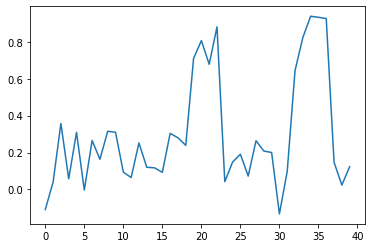

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 12 of 100 =========
train loss: -18.18

========= Epoch 13 of 100 =========


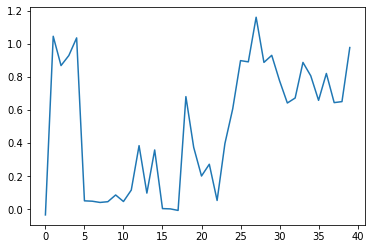

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 13 of 100 =========
train loss: -22.75

========= Epoch 14 of 100 =========


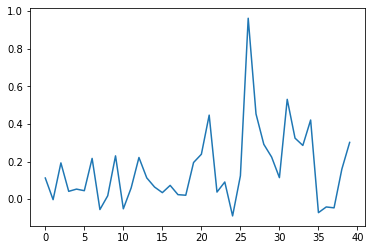

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 14 of 100 =========
train loss: -26.15

========= Epoch 15 of 100 =========


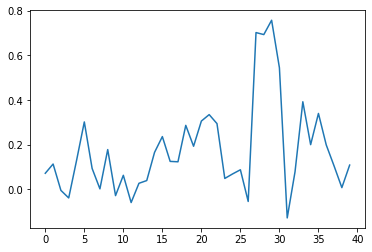

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 15 of 100 =========
train loss: -28.23

========= Epoch 16 of 100 =========


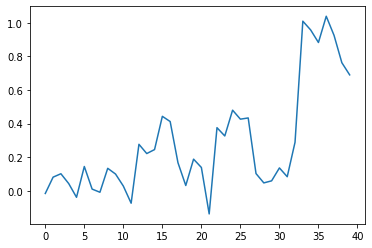

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 16 of 100 =========
train loss: -30.02

========= Epoch 17 of 100 =========


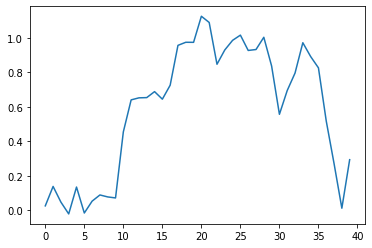

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 17 of 100 =========
train loss: -31.45

========= Epoch 18 of 100 =========


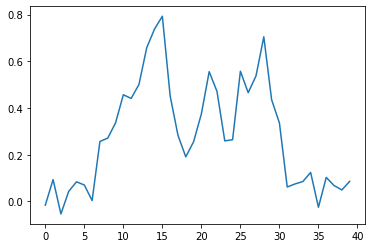

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 18 of 100 =========
train loss: -32.75

========= Epoch 19 of 100 =========


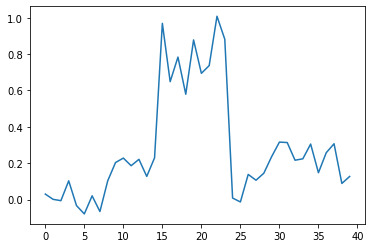

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 19 of 100 =========
train loss: -33.67

========= Epoch 20 of 100 =========


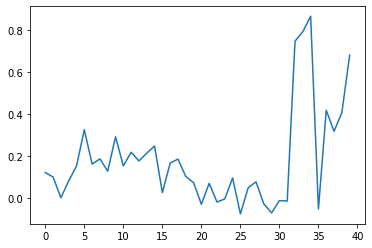

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 20 of 100 =========
train loss: -34.52

========= Epoch 21 of 100 =========


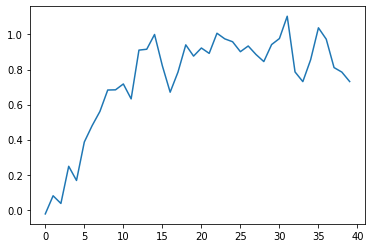

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 21 of 100 =========
train loss: -35.27

========= Epoch 22 of 100 =========


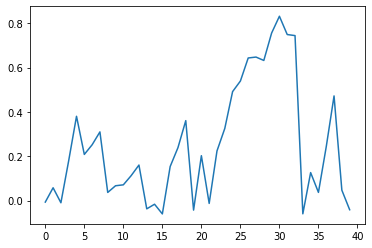

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 22 of 100 =========
train loss: -36.01

========= Epoch 23 of 100 =========


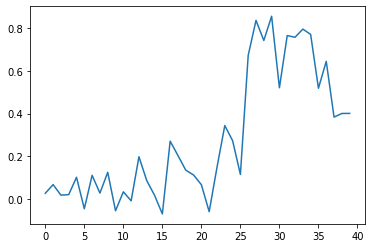

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 23 of 100 =========
train loss: -36.56

========= Epoch 24 of 100 =========


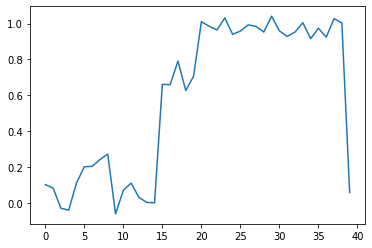

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 24 of 100 =========
train loss: -37.07

========= Epoch 25 of 100 =========


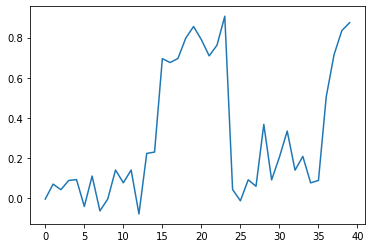

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 25 of 100 =========
train loss: -37.39

========= Epoch 26 of 100 =========


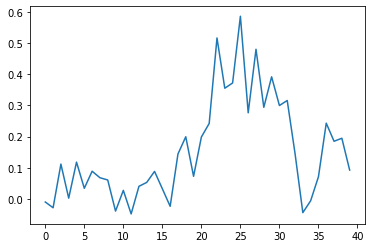

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 26 of 100 =========
train loss: -37.75

========= Epoch 27 of 100 =========


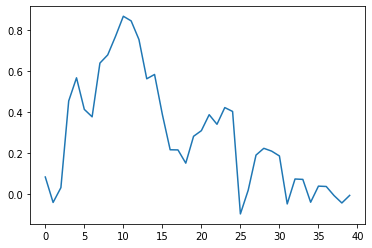

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 27 of 100 =========
train loss: -38.04

========= Epoch 28 of 100 =========


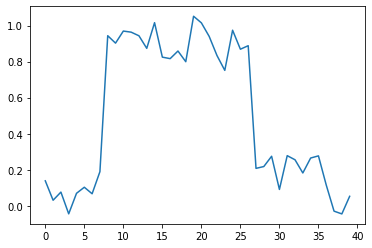

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 28 of 100 =========
train loss: -38.31

========= Epoch 29 of 100 =========


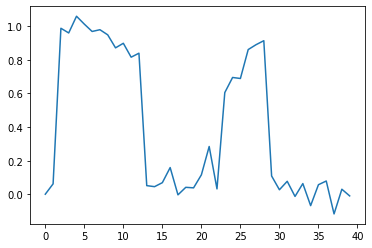

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 29 of 100 =========
train loss: -38.74

========= Epoch 30 of 100 =========


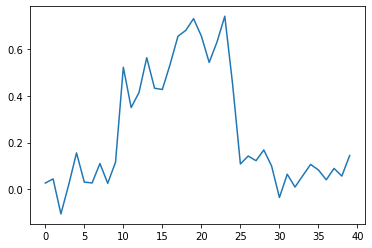

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 30 of 100 =========
train loss: -38.93

========= Epoch 31 of 100 =========


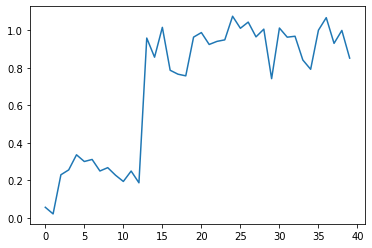

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 31 of 100 =========
train loss: -38.91

========= Epoch 32 of 100 =========


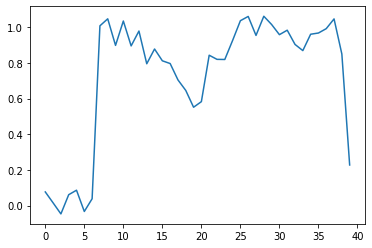

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 32 of 100 =========
train loss: -39.19

========= Epoch 33 of 100 =========


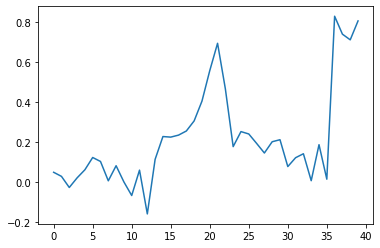

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 33 of 100 =========
train loss: -39.32

========= Epoch 34 of 100 =========


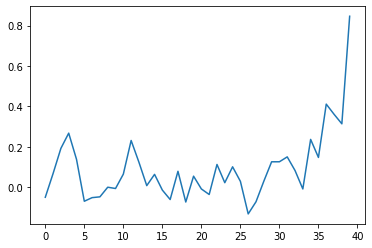

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 34 of 100 =========
train loss: -39.46

========= Epoch 35 of 100 =========


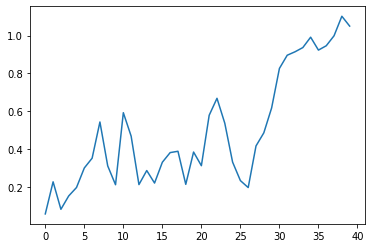

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 35 of 100 =========
train loss: -39.60

========= Epoch 36 of 100 =========


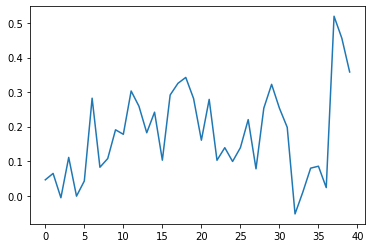

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 36 of 100 =========
train loss: -39.61

========= Epoch 37 of 100 =========


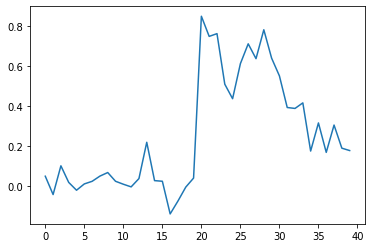

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 37 of 100 =========
train loss: -39.65

========= Epoch 38 of 100 =========


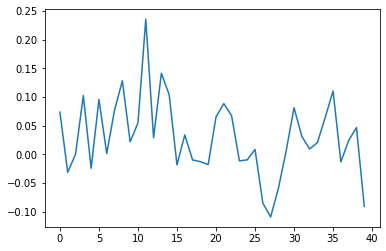

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 38 of 100 =========
train loss: -39.92

========= Epoch 39 of 100 =========


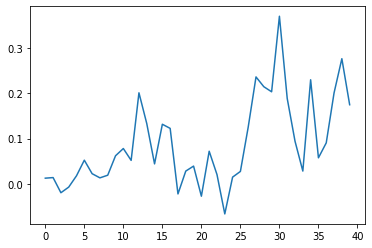

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 39 of 100 =========
train loss: -39.96

========= Epoch 40 of 100 =========


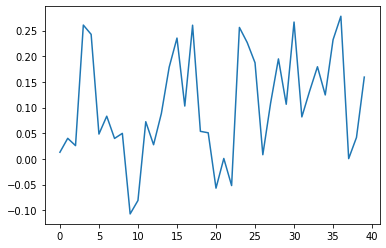

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 40 of 100 =========
train loss: -39.96

========= Epoch 41 of 100 =========


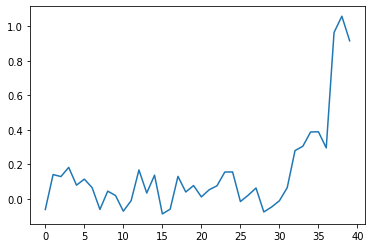

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 41 of 100 =========
train loss: -39.90

========= Epoch 42 of 100 =========


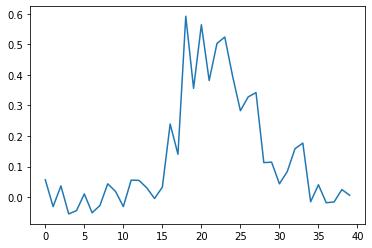

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 42 of 100 =========
train loss: -40.05

========= Epoch 43 of 100 =========


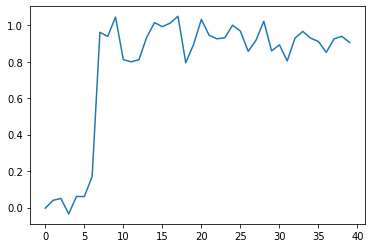

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 43 of 100 =========
train loss: -40.20

========= Epoch 44 of 100 =========


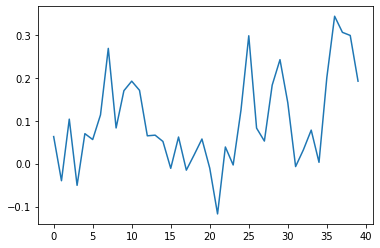

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 44 of 100 =========
train loss: -40.23

========= Epoch 45 of 100 =========


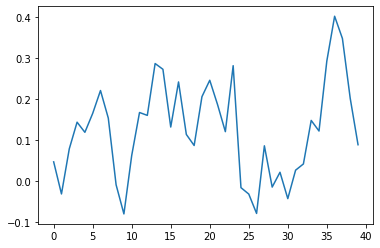

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 45 of 100 =========
train loss: -40.10

========= Epoch 46 of 100 =========


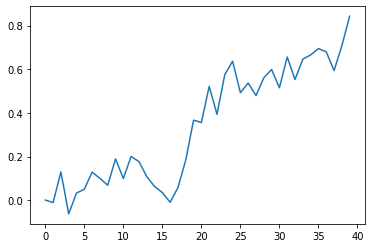

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 46 of 100 =========
train loss: -40.02

========= Epoch 47 of 100 =========


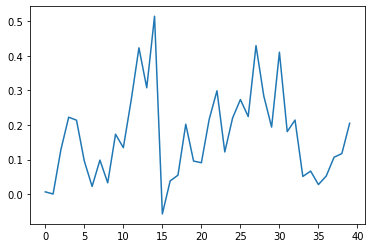

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 47 of 100 =========
train loss: -40.28

========= Epoch 48 of 100 =========


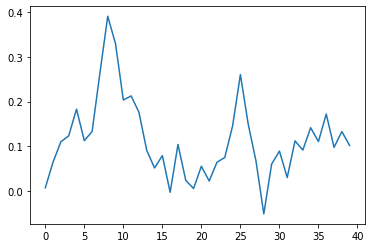

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 48 of 100 =========
train loss: -40.36

========= Epoch 49 of 100 =========


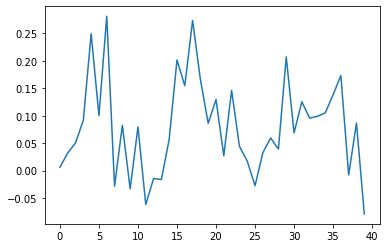

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 49 of 100 =========
train loss: -40.44

========= Epoch 50 of 100 =========


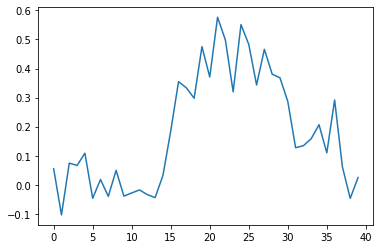

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 50 of 100 =========
train loss: -40.48

========= Epoch 51 of 100 =========


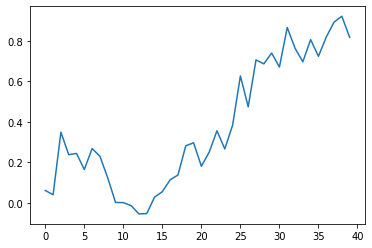

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 51 of 100 =========
train loss: -40.63

========= Epoch 52 of 100 =========


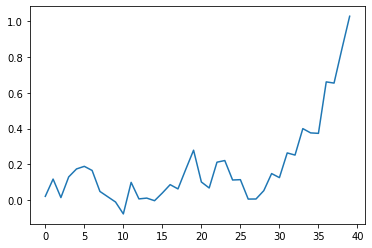

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 52 of 100 =========
train loss: -40.59

========= Epoch 53 of 100 =========


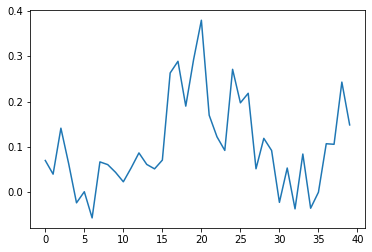

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 53 of 100 =========
train loss: -40.61

========= Epoch 54 of 100 =========


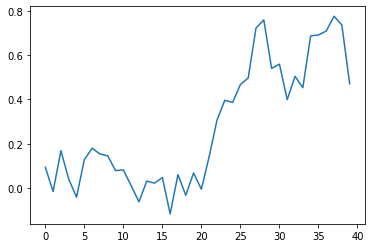

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 54 of 100 =========
train loss: -40.53

========= Epoch 55 of 100 =========


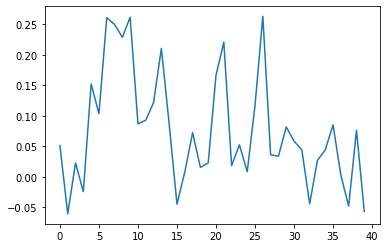

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 55 of 100 =========
train loss: -40.42

========= Epoch 56 of 100 =========


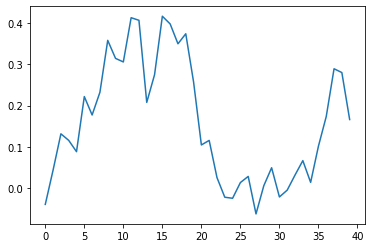

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 56 of 100 =========
train loss: -40.61

========= Epoch 57 of 100 =========


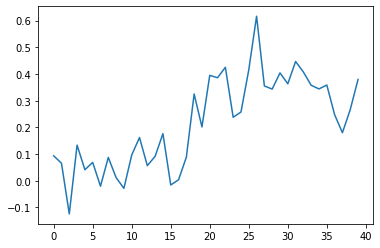

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 57 of 100 =========
train loss: -40.68

========= Epoch 58 of 100 =========


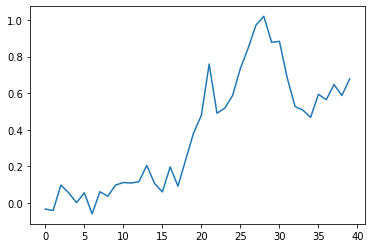

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 58 of 100 =========
train loss: -40.79

========= Epoch 59 of 100 =========


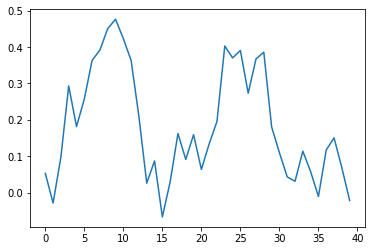

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 59 of 100 =========
train loss: -40.59

========= Epoch 60 of 100 =========


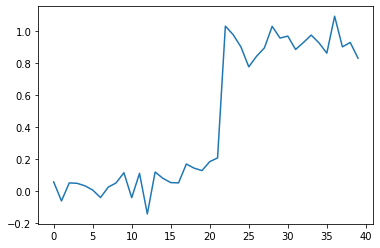

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 60 of 100 =========
train loss: -40.41

========= Epoch 61 of 100 =========


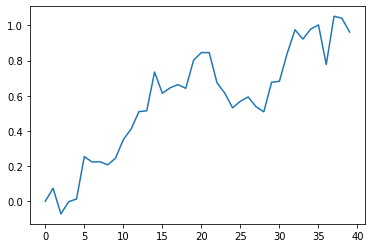

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 61 of 100 =========
train loss: -40.52

========= Epoch 62 of 100 =========


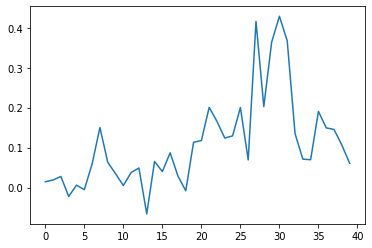

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 62 of 100 =========
train loss: -40.64

========= Epoch 63 of 100 =========


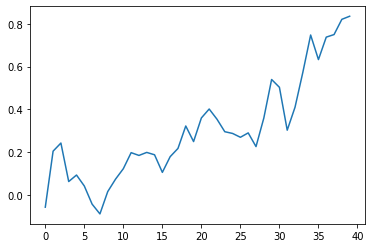

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 63 of 100 =========
train loss: -40.65

========= Epoch 64 of 100 =========


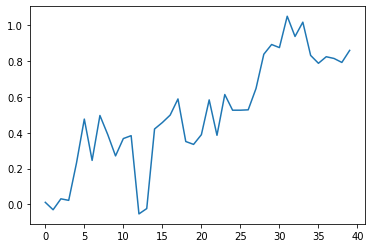

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 64 of 100 =========
train loss: -40.88

========= Epoch 65 of 100 =========


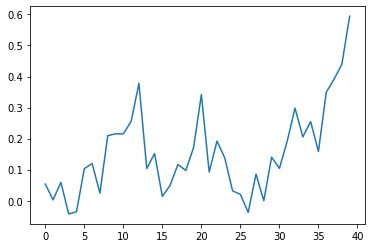

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 65 of 100 =========
train loss: -40.77

========= Epoch 66 of 100 =========


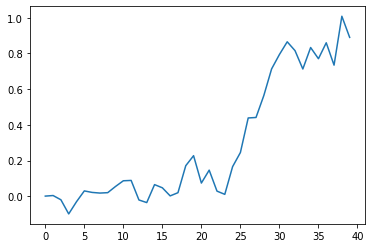

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 66 of 100 =========
train loss: -40.62

========= Epoch 67 of 100 =========


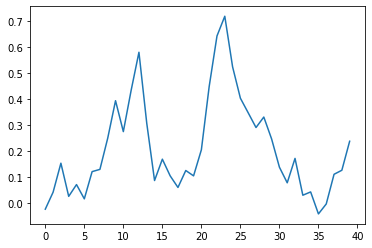

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 67 of 100 =========
train loss: -40.65

========= Epoch 68 of 100 =========


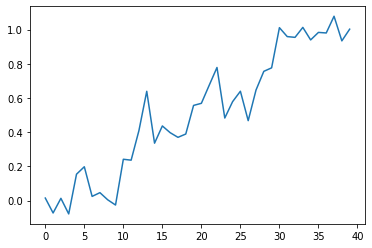

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 68 of 100 =========
train loss: -40.75

========= Epoch 69 of 100 =========


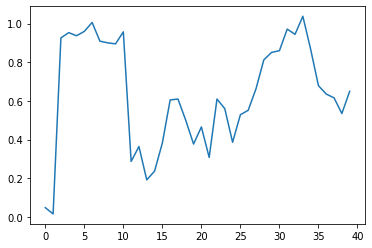

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 69 of 100 =========
train loss: -40.93

========= Epoch 70 of 100 =========


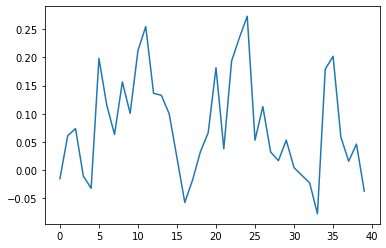

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 70 of 100 =========
train loss: -40.92

========= Epoch 71 of 100 =========


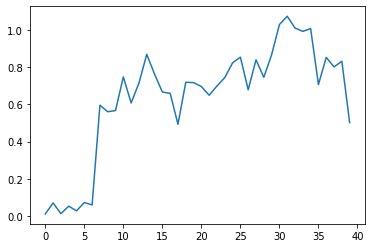

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 71 of 100 =========
train loss: -40.71

========= Epoch 72 of 100 =========


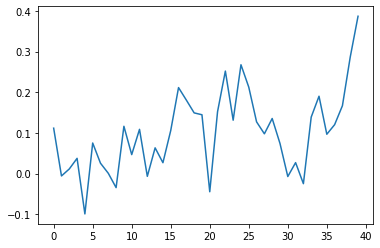

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 72 of 100 =========
train loss: -40.76

========= Epoch 73 of 100 =========


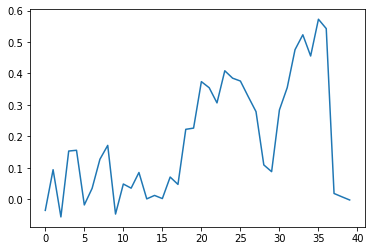

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 73 of 100 =========
train loss: -40.97

========= Epoch 74 of 100 =========


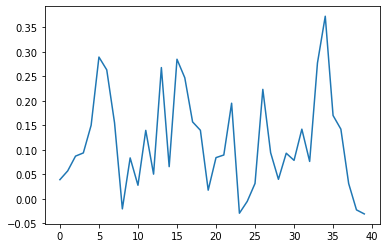

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 74 of 100 =========
train loss: -41.01

========= Epoch 75 of 100 =========


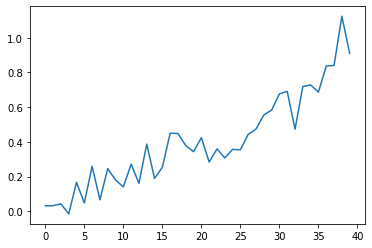

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 75 of 100 =========
train loss: -40.93

========= Epoch 76 of 100 =========


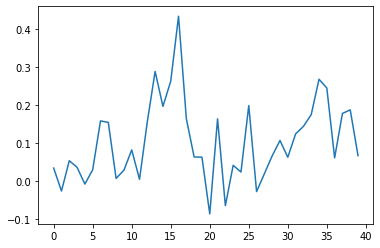

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 76 of 100 =========
train loss: -40.91

========= Epoch 77 of 100 =========


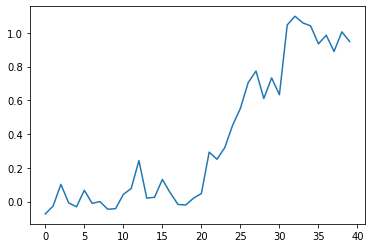

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 77 of 100 =========
train loss: -40.99

========= Epoch 78 of 100 =========


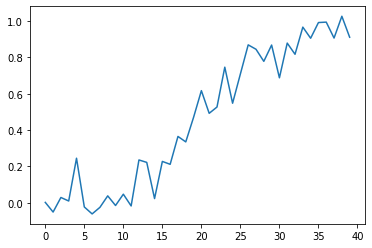

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 78 of 100 =========
train loss: -40.82

========= Epoch 79 of 100 =========


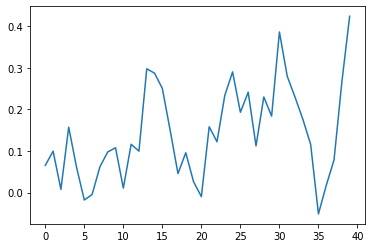

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 79 of 100 =========
train loss: -40.82

========= Epoch 80 of 100 =========


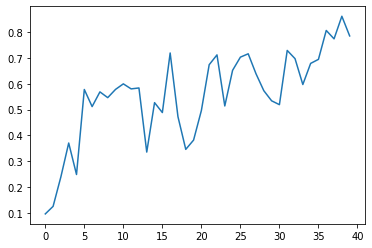

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 80 of 100 =========
train loss: -40.88

========= Epoch 81 of 100 =========


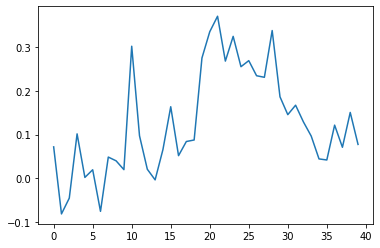

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 81 of 100 =========
train loss: -41.02

========= Epoch 82 of 100 =========


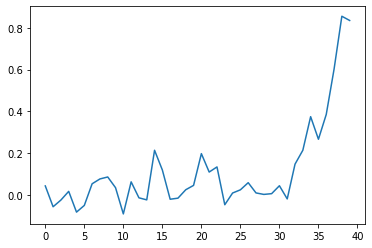

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 82 of 100 =========
train loss: -41.10

========= Epoch 83 of 100 =========


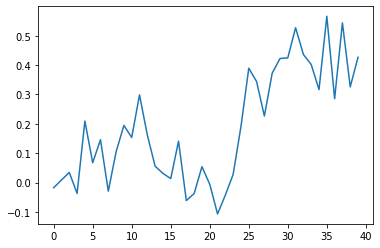

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 83 of 100 =========
train loss: -41.03

========= Epoch 84 of 100 =========


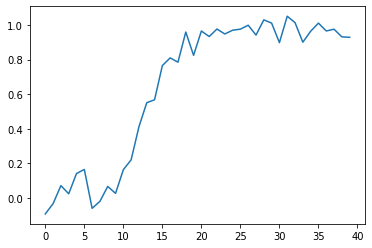

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 84 of 100 =========
train loss: -40.98

========= Epoch 85 of 100 =========


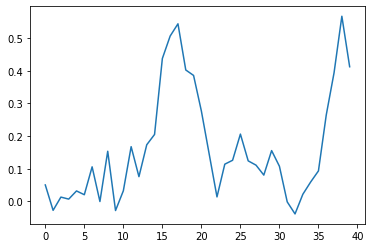

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 85 of 100 =========
train loss: -40.79

========= Epoch 86 of 100 =========


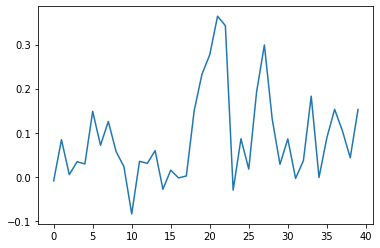

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 86 of 100 =========
train loss: -40.96

========= Epoch 87 of 100 =========


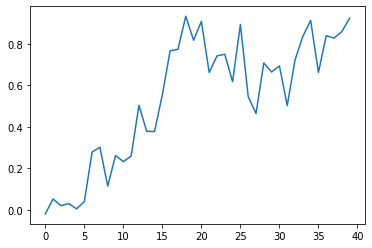

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 87 of 100 =========
train loss: -41.02

========= Epoch 88 of 100 =========


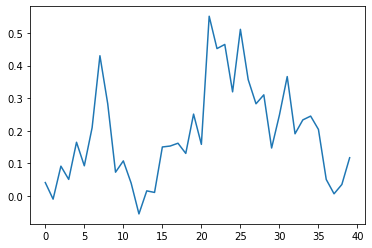

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 88 of 100 =========
train loss: -40.94

========= Epoch 89 of 100 =========


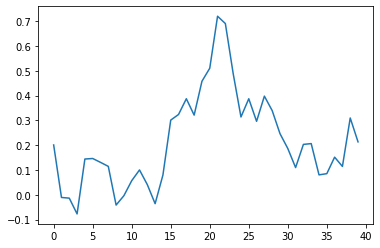

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 89 of 100 =========
train loss: -41.04

========= Epoch 90 of 100 =========


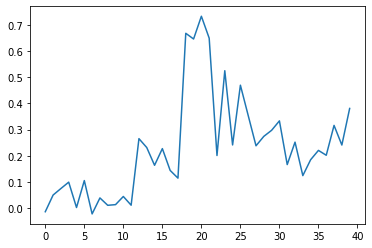

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 90 of 100 =========
train loss: -41.05

========= Epoch 91 of 100 =========


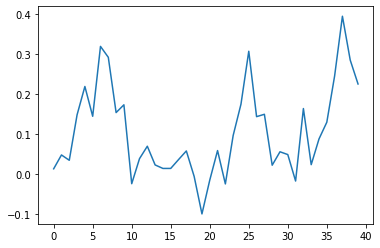

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 91 of 100 =========
train loss: -41.08

========= Epoch 92 of 100 =========


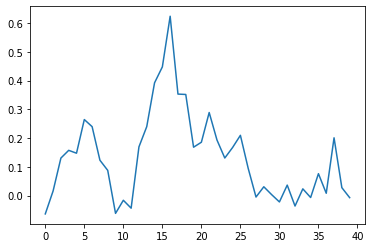

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 92 of 100 =========
train loss: -41.15

========= Epoch 93 of 100 =========


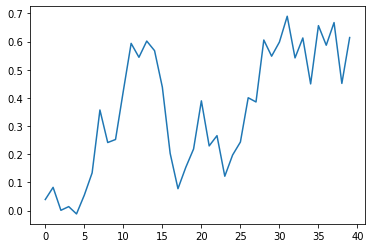

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 93 of 100 =========
train loss: -41.09

========= Epoch 94 of 100 =========


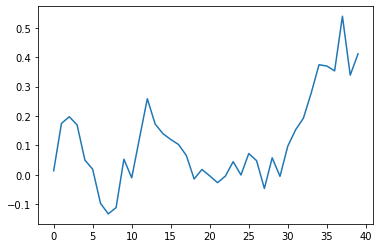

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 94 of 100 =========
train loss: -41.12

========= Epoch 95 of 100 =========


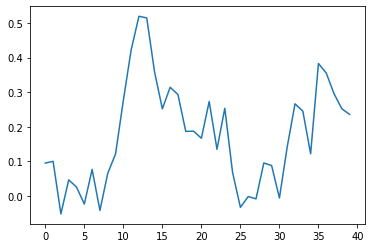

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 95 of 100 =========
train loss: -41.16

========= Epoch 96 of 100 =========


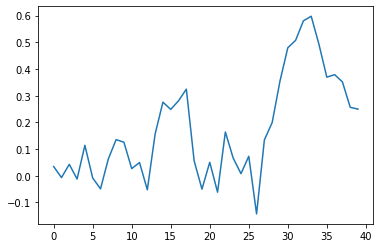

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 96 of 100 =========
train loss: -41.14

========= Epoch 97 of 100 =========


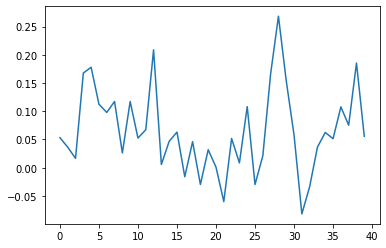

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 97 of 100 =========
train loss: -40.97

========= Epoch 98 of 100 =========


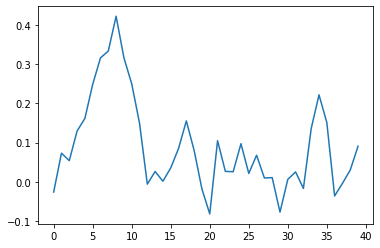

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 98 of 100 =========
train loss: -40.93

========= Epoch 99 of 100 =========


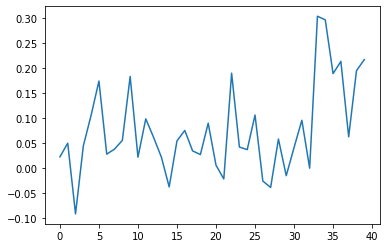

  0%|          | 0/10 [00:00<?, ?it/s]


========= Results: epoch 99 of 100 =========
train loss: -41.04

========= Epoch 100 of 100 =========


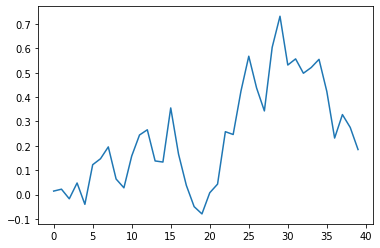

100%|██████████| 10/10 [00:00<00:00, 15.40it/s]


========= Results: epoch 100 of 100 =========
train loss: -41.05



In [49]:
num_epochs = 20
trainer = Trainer(model, lr=0.01)

for epoch in range(num_epochs):
        print("========= Epoch %d of %d =========" % (epoch+1, num_epochs))
        train_loss = trainer.train(train_dataset)
        # valid_loss = trainer.test(valid_dataset)

        print("\n========= Results: epoch %d of %d =========" % (epoch+1, num_epochs))
        print("train loss: %.2f\n" % (train_loss) )

        writer.add_histogram('Mean', model.emission_model.means, epoch)
        writer.add_scalar("Train Loss", train_loss, epoch)

In [50]:
model.emission_model.means

Parameter containing:
tensor([ 0.0243,  0.8292,  0.1324,  0.5250,  0.9699,  0.6860,  0.0315,  0.2520,
        -0.0407,  0.3857], requires_grad=True)

In [51]:
model.emission_model.std

Parameter containing:
tensor([0.0473, 0.0445, 0.0493, 0.0551, 0.0500, 0.0555, 0.0475, 0.0513, 0.0363,
        0.0412], requires_grad=True)

In [23]:
%tensorboard --logdir {logs_base_dir}

Reusing TensorBoard on port 6006 (pid 629), started 3:50:53 ago. (Use '!kill 629' to kill it.)

<IPython.core.display.Javascript object>

## Delete Tensorboard Logs

In [ ]:
# ! rm -rf runs/
# os.makedirs(logs_base_dir, exist_ok=True)

## Putting Tensorboard on public URL

In [ ]:
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip

--2020-11-18 15:01:47--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.2.56.23, 3.222.114.249, 54.236.74.205, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.2.56.23|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13773305 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.13M  36.5MB/s    in 0.4s    

2020-11-18 15:01:47 (36.5 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13773305/13773305]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   


In [ ]:
LOG_DIR = 'runs'
os.makedirs(LOG_DIR, exist_ok=True)
get_ipython().system_raw(
    'tensorboard --logdir {} --host 0.0.0.0 --port 6006 &'
    .format(LOG_DIR))
get_ipython().system_raw('./ngrok http 6006 &')

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

https://28279415332b.ngrok.io


In [ ]:
x = []
for i in range(5000):
    x.append(torch.normal(torch.tensor([0.0]), torch.tensor([1.0])))

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


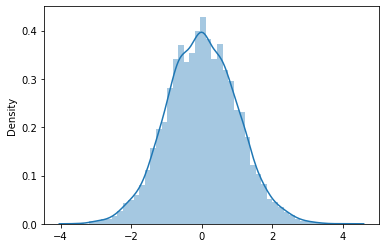

In [ ]:
sns.distplot(x)

In [ ]:
a = torch.tensor([0.0, 0.0, 0.0])
b = torch.tensor([1.0, 1.0, 1.0])

dists = [tdist.normal.Normal(a[i], b[i]) for i in range(len(a))]
    

In [ ]:
dists

[Normal(loc: 0.0, scale: 1.0),
 Normal(loc: 0.0, scale: 1.0),
 Normal(loc: 0.0, scale: 1.0)]

In [ ]:
a[0] = 2.0

In [ ]:
dists

[Normal(loc: 2.0, scale: 1.0),
 Normal(loc: 0.0, scale: 1.0),
 Normal(loc: 0.0, scale: 1.0)]

In [238]:
a = torch.randn([6,5])

In [239]:
a

tensor([[ 1.2362,  0.9078,  0.6248, -0.2014, -0.3455],
        [ 1.3800, -0.7435, -0.6532, -0.3105,  0.1984],
        [-0.7974,  0.8226, -1.5842,  0.4252,  0.5143],
        [-1.9281, -1.6889,  0.7109, -0.5700,  0.3918],
        [ 0.2143,  0.8593,  0.0511,  0.8667,  0.7709],
        [-0.3851,  2.1578, -0.5610, -0.0627,  2.1991]])

In [240]:
torch.tril(a, diagonal=0)

tensor([[ 1.2362,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 1.3800, -0.7435,  0.0000,  0.0000,  0.0000],
        [-0.7974,  0.8226, -1.5842,  0.0000,  0.0000],
        [-1.9281, -1.6889,  0.7109, -0.5700,  0.0000],
        [ 0.2143,  0.8593,  0.0511,  0.8667,  0.7709],
        [-0.3851,  2.1578, -0.5610, -0.0627,  2.1991]])

In [241]:
torch.triu(a, diagonal=0)

tensor([[ 1.2362,  0.9078,  0.6248, -0.2014, -0.3455],
        [ 0.0000, -0.7435, -0.6532, -0.3105,  0.1984],
        [ 0.0000,  0.0000, -1.5842,  0.4252,  0.5143],
        [ 0.0000,  0.0000,  0.0000, -0.5700,  0.3918],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.7709],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000]])

In [242]:
test_transition = torch.tril(torch.triu(a, diagonal=-1), diagonal=0)
# test_transition[test_transition == 0 ] = -np.inf
# test_transition.requires_grad = True

In [243]:
test_transition # Opposite of this 

tensor([[ 1.2362,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 1.3800, -0.7435,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.8226, -1.5842,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.7109, -0.5700,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.8667,  0.7709],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  2.1991]])

In [244]:
mask = ~torch.eq(test_transition, 0)
mask

tensor([[ True, False, False, False, False],
        [ True,  True, False, False, False],
        [False,  True,  True, False, False],
        [False, False,  True,  True, False],
        [False, False, False,  True,  True],
        [False, False, False, False,  True]])

In [245]:
A = test_transition

In [246]:
# Get Maximum from each row
A_max = torch.max(A,dim=1,keepdim=True)[0]
# Subtract the maximum and then exponentiate it
A_exp = torch.exp(A-A_max)

# Find e^x and mask for zero elements
A_exp = A_exp * (A != 0) # this step masks

# Apply softmax
A_softmax = A_exp / torch.sum(A_exp,dim=0,keepdim=True)

# Set zero element as 1
A_softmax[(A == 0)] = 1.0

# Apply Log of softmax operation
# A_softmax
torch.log(A_softmax)


tensor([[-0.6931,  0.0000,  0.0000,  0.0000,  0.0000],
        [-0.6931, -2.2365,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -0.1130, -2.4931,  0.0000,  0.0000],
        [ 0.0000,  0.0000, -0.0863, -1.5260,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.2451, -0.7422],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.6464]])

In [247]:
A_max = torch.max(A,dim=1,keepdim=True)[0]
A_max

tensor([[1.2362],
        [1.3800],
        [0.8226],
        [0.7109],
        [0.8667],
        [2.1991]])

In [221]:
A-A_max

tensor([[ 0.0000, -0.9520, -0.9520, -0.9520, -0.9520],
        [-1.0690,  0.0000, -2.0312, -2.0312, -2.0312],
        [ 0.0000, -1.0785, -0.3323,  0.0000,  0.0000],
        [ 0.0000,  0.0000, -1.3211, -0.2110,  0.0000],
        [-0.0310, -0.0310, -0.0310,  0.0000, -0.8838],
        [-0.7526, -0.7526, -0.7526, -0.7526,  0.0000]])

In [222]:
A_exp = torch.exp(A-A_max)
A_exp

tensor([[1.0000, 0.3860, 0.3860, 0.3860, 0.3860],
        [0.3433, 1.0000, 0.1312, 0.1312, 0.1312],
        [1.0000, 0.3401, 0.7173, 1.0000, 1.0000],
        [1.0000, 1.0000, 0.2668, 0.8097, 1.0000],
        [0.9695, 0.9695, 0.9695, 1.0000, 0.4132],
        [0.4712, 0.4712, 0.4712, 0.4712, 1.0000]])

In [223]:
(A != 0)

tensor([[ True, False, False, False, False],
        [ True,  True, False, False, False],
        [False,  True,  True, False, False],
        [False, False,  True,  True, False],
        [False, False, False,  True,  True],
        [False, False, False, False,  True]])

In [224]:
A_exp = A_exp * (A != 0)
A_exp

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.3433, 1.0000, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.3401, 0.7173, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.2668, 0.8097, 0.0000],
        [0.0000, 0.0000, 0.0000, 1.0000, 0.4132],
        [0.0000, 0.0000, 0.0000, 0.0000, 1.0000]])

In [225]:
A_softmax = A_exp / torch.sum(A_exp,dim=0,keepdim=True)
A_softmax

tensor([[0.7444, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2556, 0.7462, 0.0000, 0.0000, 0.0000],
        [0.0000, 0.2538, 0.7288, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.2712, 0.4474, 0.0000],
        [0.0000, 0.0000, 0.0000, 0.5526, 0.2924],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.7076]])

In [226]:
A_softmax[(A == 0)] = 1.0
A_softmax

tensor([[0.7444, 1.0000, 1.0000, 1.0000, 1.0000],
        [0.2556, 0.7462, 1.0000, 1.0000, 1.0000],
        [1.0000, 0.2538, 0.7288, 1.0000, 1.0000],
        [1.0000, 1.0000, 0.2712, 0.4474, 1.0000],
        [1.0000, 1.0000, 1.0000, 0.5526, 0.2924],
        [1.0000, 1.0000, 1.0000, 1.0000, 0.7076]])

In [227]:
torch.log(A_softmax)

tensor([[-0.2952,  0.0000,  0.0000,  0.0000,  0.0000],
        [-1.3642, -0.2927,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -1.3713, -0.3163,  0.0000,  0.0000],
        [ 0.0000,  0.0000, -1.3051, -0.8042,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.5932, -1.2297],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.3459]])

In [228]:
torch.max(A,dim=1,keepdim=True)[0].shape

torch.Size([6, 1])

In [198]:
a = torch.tensor([1.0, 2.0, 3.0, 4.0])
a

tensor([1., 2., 3., 4.])

In [199]:
F.softmax(a, dim=0)

tensor([0.0321, 0.0871, 0.2369, 0.6439])

In [203]:
a  - torch.max(a, 0, keepdim=True)[0]

tensor([-3., -2., -1.,  0.])

In [205]:
F.softmax(a  - torch.max(a, 0, keepdim=True)[0], dim=0)

tensor([0.0321, 0.0871, 0.2369, 0.6439])